# Part 1 Code 

In [45]:
import os
import time
import selective_search as ss
import numpy as np
import xml.etree.ElementTree as ET
from collections import OrderedDict,Counter
import matplotlib.pyplot as plt
import pandas as pd 
import imageio
import seaborn as sns
import scipy.misc
import skimage.segmentation
import skimage.feature
from copy import copy
import tensorflow as tf
import keras
import scipy
import sklearn
import argparse
from keras.preprocessing import image
from keras.applications import imagenet_utils
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import multi_gpu_model
from keras.applications.mobilenet import preprocess_input
from keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Activation, Conv2D, Flatten, GlobalAveragePooling2D, Dropout, Reshape
from tensorflow.keras import optimizers
import os
from tensorflow.keras import applications
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.preprocessing.image import ImageDataGenerator

In [35]:
dir_anno = "VOCdevkit/VOC2012/Annotations"
img_dir  = "VOCdevkit/VOC2012/JPEGImages"
imgnm     = "2012_002870.jpg"

In [3]:
def extract_single_xml_file(tree):
    Nobj = 0
    row  = OrderedDict()
    for elems in tree.iter():

        if elems.tag == "size":
            for elem in elems:
                row[elem.tag] = int(elem.text)
        if elems.tag == "object":
            for elem in elems:
                if elem.tag == "name":
                    row["bbx_{}_{}".format(Nobj,elem.tag)] = str(elem.text)              
                if elem.tag == "bndbox":
                    for k in elem:
                        row["bbx_{}_{}".format(Nobj,k.tag)] = float(k.text)
                    Nobj += 1
    row["Nobj"] = Nobj
    return(row)

df_anno = []
for fnm in os.listdir(dir_anno):  
    if not fnm.startswith('.'): ## do not include hidden folders/files
        tree = ET.parse(os.path.join(dir_anno,fnm))
        row = extract_single_xml_file(tree)
        row["fileID"] = fnm.split(".")[0]
        df_anno.append(row)
df_anno = pd.DataFrame(df_anno)

maxNobj = np.max(df_anno["Nobj"])


print("columns in df_anno\n-----------------")
for icol, colnm in enumerate(df_anno.columns):
    print("{:3.0f}: {}".format(icol,colnm))
print("-"*30)
print("df_anno.shape={}=(N frames, N columns)".format(df_anno.shape))
df_anno.head()

columns in df_anno
-----------------
  0: width
  1: height
  2: depth
  3: bbx_0_name
  4: bbx_0_xmin
  5: bbx_0_ymin
  6: bbx_0_xmax
  7: bbx_0_ymax
  8: Nobj
  9: fileID
 10: bbx_1_name
 11: bbx_1_xmin
 12: bbx_1_ymin
 13: bbx_1_xmax
 14: bbx_1_ymax
 15: bbx_2_name
 16: bbx_2_xmin
 17: bbx_2_ymin
 18: bbx_2_xmax
 19: bbx_2_ymax
 20: bbx_3_name
 21: bbx_3_xmin
 22: bbx_3_ymin
 23: bbx_3_xmax
 24: bbx_3_ymax
 25: bbx_4_name
 26: bbx_4_xmin
 27: bbx_4_ymin
 28: bbx_4_xmax
 29: bbx_4_ymax
 30: bbx_5_name
 31: bbx_5_xmin
 32: bbx_5_ymin
 33: bbx_5_xmax
 34: bbx_5_ymax
 35: bbx_6_name
 36: bbx_6_xmin
 37: bbx_6_ymin
 38: bbx_6_xmax
 39: bbx_6_ymax
 40: bbx_7_name
 41: bbx_7_xmin
 42: bbx_7_ymin
 43: bbx_7_xmax
 44: bbx_7_ymax
 45: bbx_8_name
 46: bbx_8_xmin
 47: bbx_8_ymin
 48: bbx_8_xmax
 49: bbx_8_ymax
 50: bbx_9_name
 51: bbx_9_xmin
 52: bbx_9_ymin
 53: bbx_9_xmax
 54: bbx_9_ymax
 55: bbx_10_name
 56: bbx_10_xmin
 57: bbx_10_ymin
 58: bbx_10_xmax
 59: bbx_10_ymax
 60: bbx_11_name
 61: 

,width,height,depth,bbx_0_name,bbx_0_xmin,bbx_0_ymin,bbx_0_xmax,bbx_0_ymax,Nobj,fileID,...,bbx_54_name,bbx_54_xmin,bbx_54_ymin,bbx_54_xmax,bbx_54_ymax,bbx_55_name,bbx_55_xmin,bbx_55_ymin,bbx_55_xmax,bbx_55_ymax
0,486,500,3,person,174.0,101.0,349.0,351.0,1,2007_000027,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,500,281,3,aeroplane,104.0,78.0,375.0,183.0,4,2007_000032,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,500,366,3,aeroplane,9.0,107.0,499.0,263.0,3,2007_000033,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,500,375,3,tvmonitor,156.0,89.0,344.0,279.0,1,2007_000039,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,500,335,3,train,263.0,32.0,500.0,295.0,2,2007_000042,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
dir_preprocessed = "VOCdevkit/VOC2012"
df_anno.to_csv(os.path.join(dir_preprocessed,"df_anno.csv"),index=False)

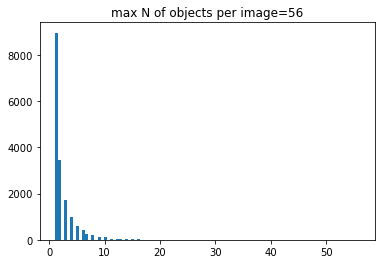

In [5]:
plt.hist(df_anno["Nobj"].values,bins=100)
plt.title("max N of objects per image={}".format(maxNobj))
plt.show()

Counter({'person': 17401, 'chair': 3056, 'car': 2492, 'dog': 1598, 'bottle': 1561, 'cat': 1277, 'bird': 1271, 'pottedplant': 1202, 'sheep': 1084, 'boat': 1059, 'aeroplane': 1002, 'tvmonitor': 893, 'sofa': 841, 'bicycle': 837, 'horse': 803, 'motorbike': 801, 'diningtable': 800, 'cow': 771, 'train': 704, 'bus': 685})


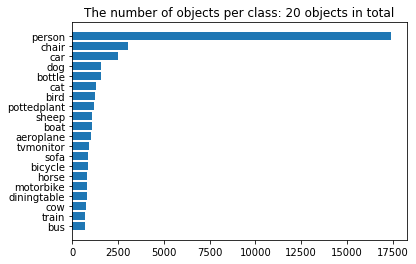

In [6]:
class_obj = []
for ibbx in range(maxNobj):
    class_obj.extend(df_anno["bbx_{}_name".format(ibbx)].values)
class_obj = np.array(class_obj)

count             = Counter(class_obj[class_obj != 'nan'])
print(count)
class_nm          = list(count.keys())
class_count       = list(count.values())
asort_class_count = np.argsort(class_count)

class_nm          = np.array(class_nm)[asort_class_count]
class_count       = np.array(class_count)[asort_class_count]

xs = range(len(class_count))
plt.barh(xs,class_count)
plt.yticks(xs,class_nm)
plt.title("The number of objects per class: {} objects in total".format(len(count)))
plt.show()

# Part 2 Code

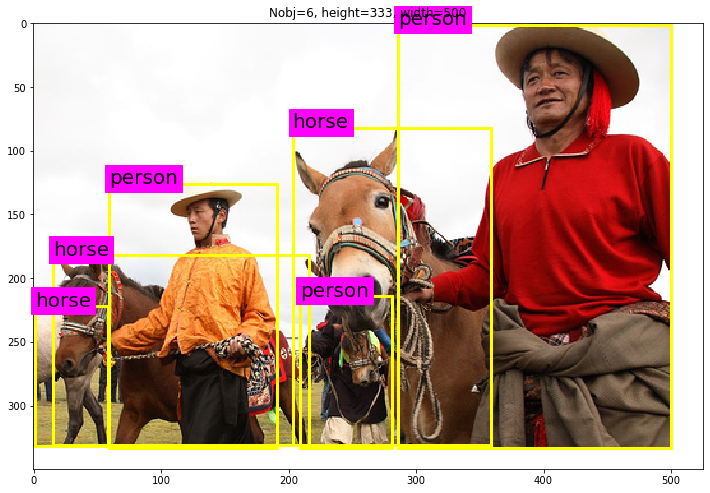

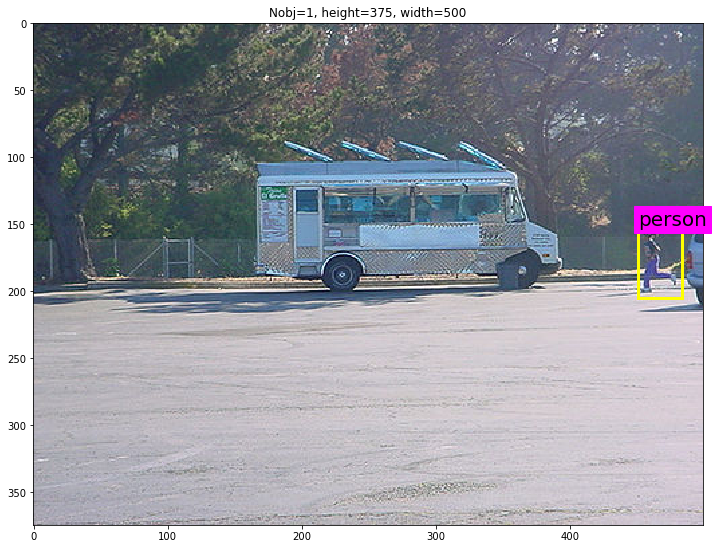

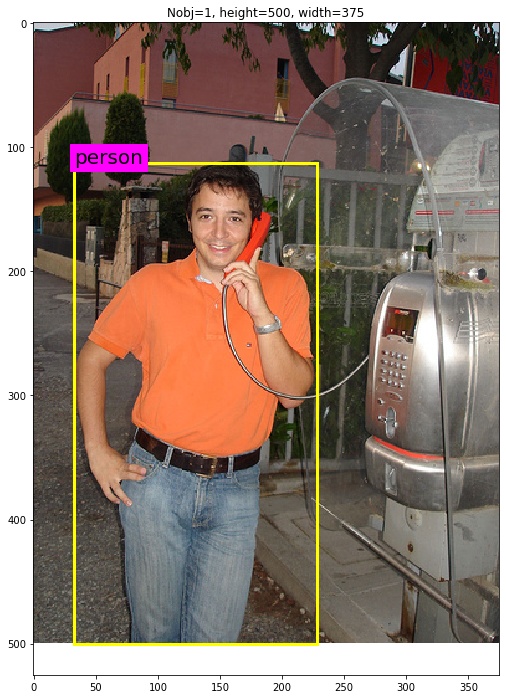

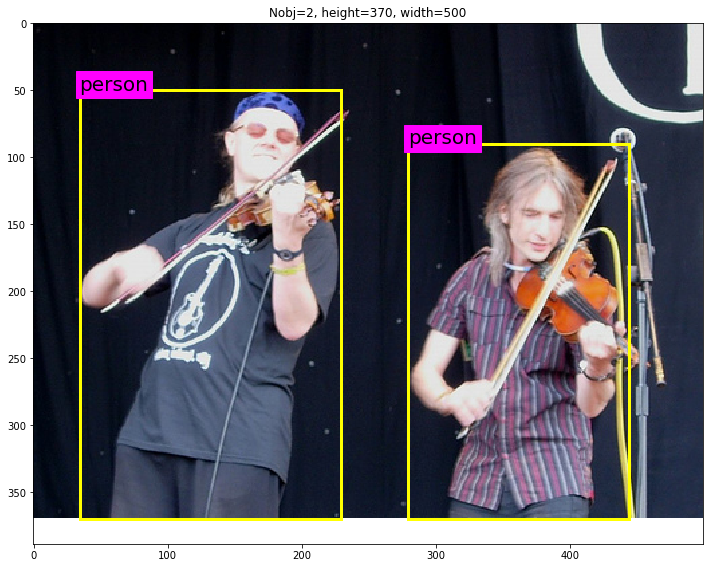

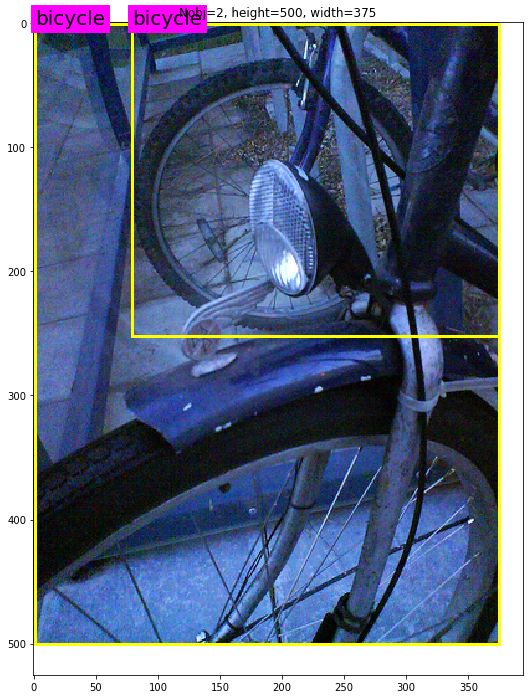

...

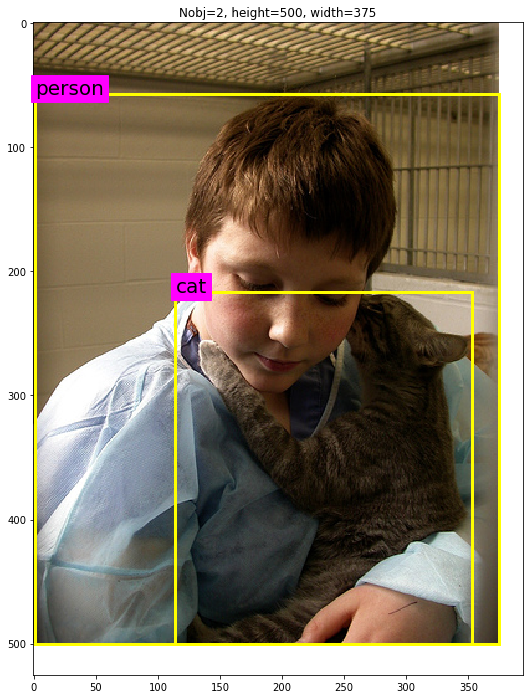

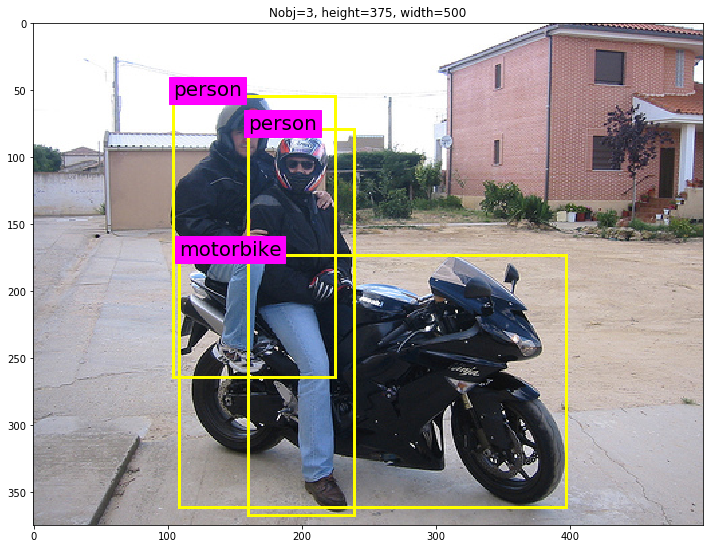

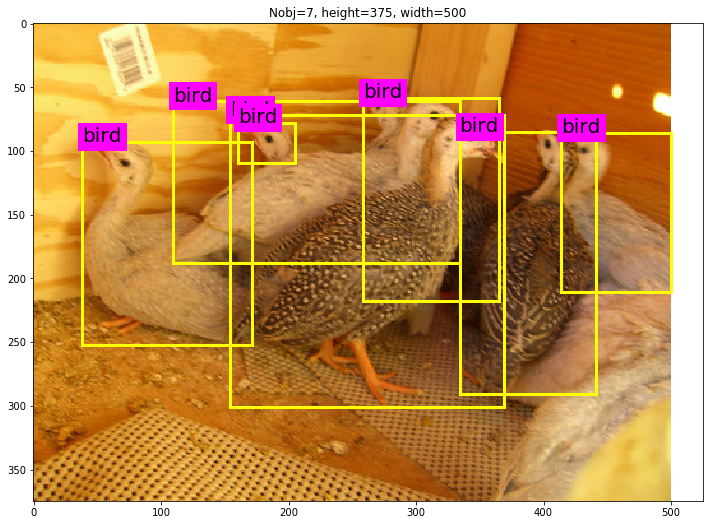

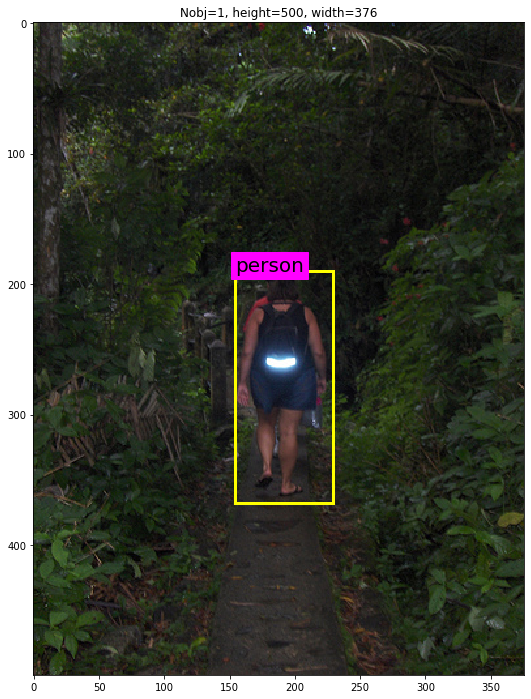

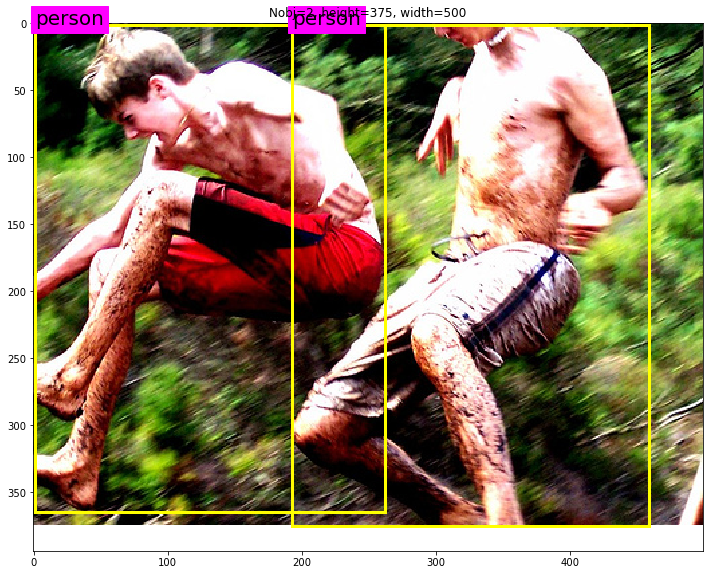

In [8]:
def plt_rectangle(plt,label,x1,y1,x2,y2):
    '''
    == Input ==
    
    plt   : matplotlib.pyplot object
    label : string containing the object class name
    x1    : top left corner x coordinate
    y1    : top left corner y coordinate
    x2    : bottom right corner x coordinate
    y2    : bottom right corner y coordinate
    '''
    linewidth = 3
    color = "yellow"
    plt.text(x1,y1,label,fontsize=20,backgroundcolor="magenta")
    plt.plot([x1,x1],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x2,x2],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y1,y1], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y2,y2], linewidth=linewidth,color=color)
    
# randomly select 20 frames    
size = 20    
ind_random = np.random.randint(0,df_anno.shape[0],size=size)
for irow in ind_random:
    row  = df_anno.iloc[irow,:]
    path = os.path.join(img_dir, row["fileID"] + ".jpg")
    # read in image
    img  = imageio.imread(path)

    plt.figure(figsize=(12,12))
    plt.imshow(img) # plot image
    plt.title("Nobj={}, height={}, width={}".format(row["Nobj"],row["height"],row["width"]))
    # for each object in the image, plot the bounding box
    for iplot in range(row["Nobj"]):
        plt_rectangle(plt,
                      label = row["bbx_{}_name".format(iplot)],
                      x1=row["bbx_{}_xmin".format(iplot)],
                      y1=row["bbx_{}_ymin".format(iplot)],
                      x2=row["bbx_{}_xmax".format(iplot)],
                      y2=row["bbx_{}_ymax".format(iplot)])
    plt.show() ## show the plot


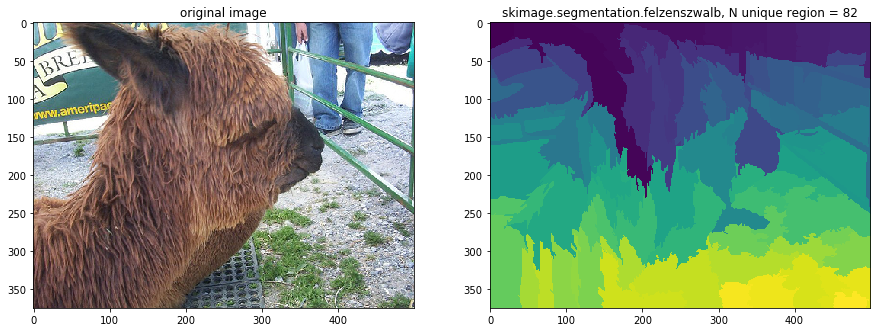

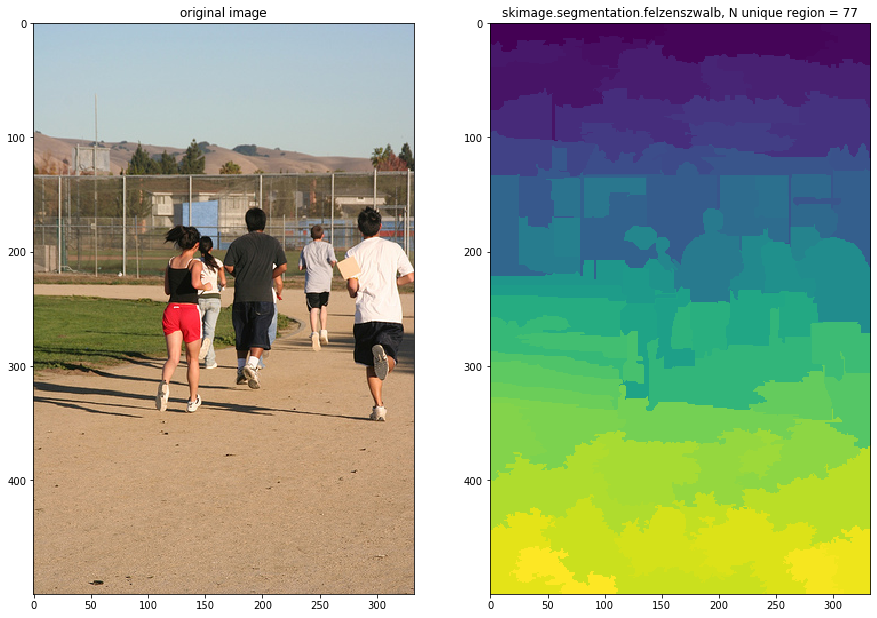

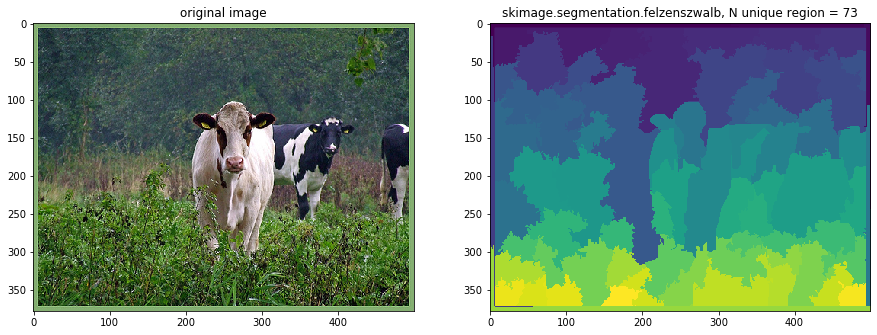

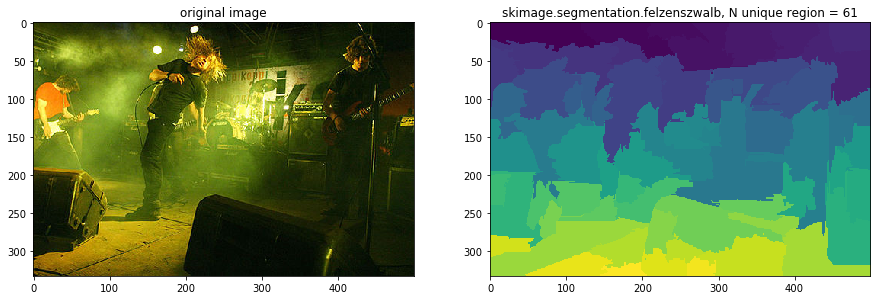

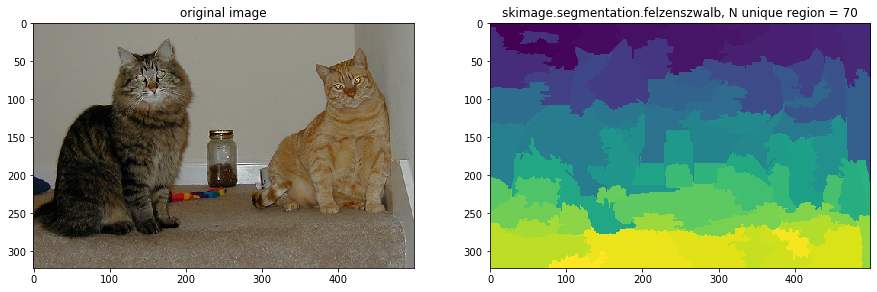

In [9]:
def image_segmentation(img_8bit, scale = 1.0, sigma = 0.8, min_size = 50):
    '''
    J.R.R. Uijlings's hierarchical grouping algorithm 
    
    == input ==
    img_8bit : shape = (height, width, 3),
               8-bits degital image (each digit ranges between 0 - 255)
    
    == output ==
    img      : shape = (height, width, 4)
    '''
    # convert the image to range between 0 and 1
    img_float = skimage.util.img_as_float(img_8bit)
    im_mask   = skimage.segmentation.felzenszwalb(
                    img_float, 
                    scale    = scale, 
                    sigma    = sigma,
                    min_size = min_size)
    img       = np.dstack([img_8bit,im_mask])
    return(img)

scale    = 1.0
sigma    = 0.8
# min_size may be around 50 for better RCNN performance but for the sake of visualization, I will stick to min_size =500
min_size = 500 # 500 3000

np.random.seed(4)
listed_path = os.listdir(img_dir)
Nplot = 5
random_img_path = np.random.choice(listed_path,Nplot)
for imgnm in random_img_path:
    # import 8 bits degital image (each digit ranges between 0 - 255)
    img_8bit  =imageio.imread(os.path.join(img_dir,imgnm))
    img       = image_segmentation(img_8bit, scale, sigma, min_size)
    
    fig = plt.figure(figsize=(15,30))
    ax  = fig.add_subplot(1,2,1)
    ax.imshow(img_8bit)
    ax.set_title("original image")
    ax  = fig.add_subplot(1,2,2)
    ax.imshow(img[:,:,3])
    ax.set_title("skimage.segmentation.felzenszwalb, N unique region = {}".format(len(np.unique(img[:,:,3]))))
    plt.show()

In [10]:
def extract_region(img):
    '''
    For each segmented region,
    extract smallest rectangle regions covering the smallest segmented region.
    
    == input ==
    img : (height, width, N channel)
          N channel = [R, G, B , L], L = label for the region
          only the L channel is used in this analysis 
    == output ==
    
    dictionary R :
    
    {0: {'labels': [0], 'max_x': 131, 'max_y': 74, 'min_x': 0,   'min_y': 0},
     1: {'labels': [1], 'max_x': 189, 'max_y': 37, 'min_x': 75,  'min_y': 0},
     2: {'labels': [2], 'max_x': 282, 'max_y': 38, 'min_x': 162, 'min_y': 0},
     3: {'labels': [3], 'max_x': 499, 'max_y': 23, 'min_x': 247, 'min_y': 0},
     4: {'labels': [4], 'max_x': 499, 'max_y': 74, 'min_x': 428, 'min_y': 13},
     5: {'labels': [5], 'max_x': 441, 'max_y': 76, 'min_x': 333, 'min_y': 16},
     6: {'labels': [6], 'max_x': 348, 'max_y': 80, 'min_x': 62,  'min_y': 21},
    '''
    ## only use the segmentation output
    img_segment = img[:,:,3]
    R = {}
    for y, i in enumerate(img_segment): ## along vertical axis 

        for x, l in enumerate(i): ## along horizontal axis
            # initialize a new region
            if l not in R:
                R[l] = {"min_x": np.Inf, 
                        "min_y": np.Inf,
                        "max_x": 0, 
                        "max_y": 0, 
                        "labels": [l]}

            # bounding box
            if R[l]["min_x"] > x:
                R[l]["min_x"] = x
            if R[l]["min_y"] > y:
                R[l]["min_y"] = y
            if R[l]["max_x"] < x:
                R[l]["max_x"] = x
            if R[l]["max_y"] < y:
                R[l]["max_y"] = y
    ## remove region if it does not have positive height or positive width
    
    Rcopy = copy(R)
    for key in R.keys():
        r = R[key]
        if (r["min_x"] == r["max_x"]) or (r["min_y"] == r["max_y"]):
            del Rcopy[key]
    return(Rcopy)
R = extract_region(img)
print("{} rectangle regions are found".format(len(R)))

70 rectangle regions are found


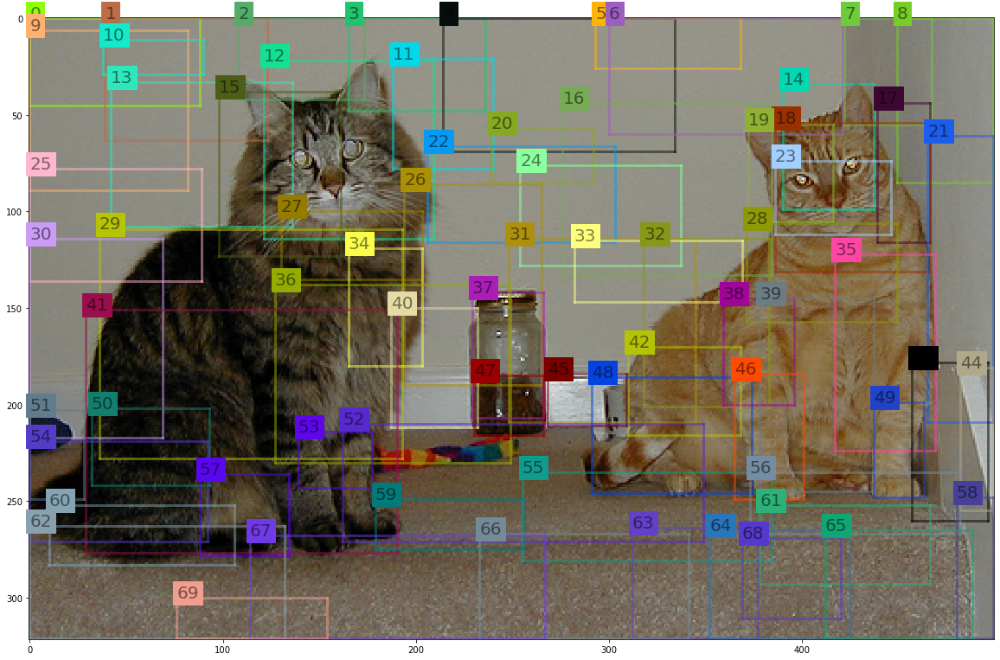

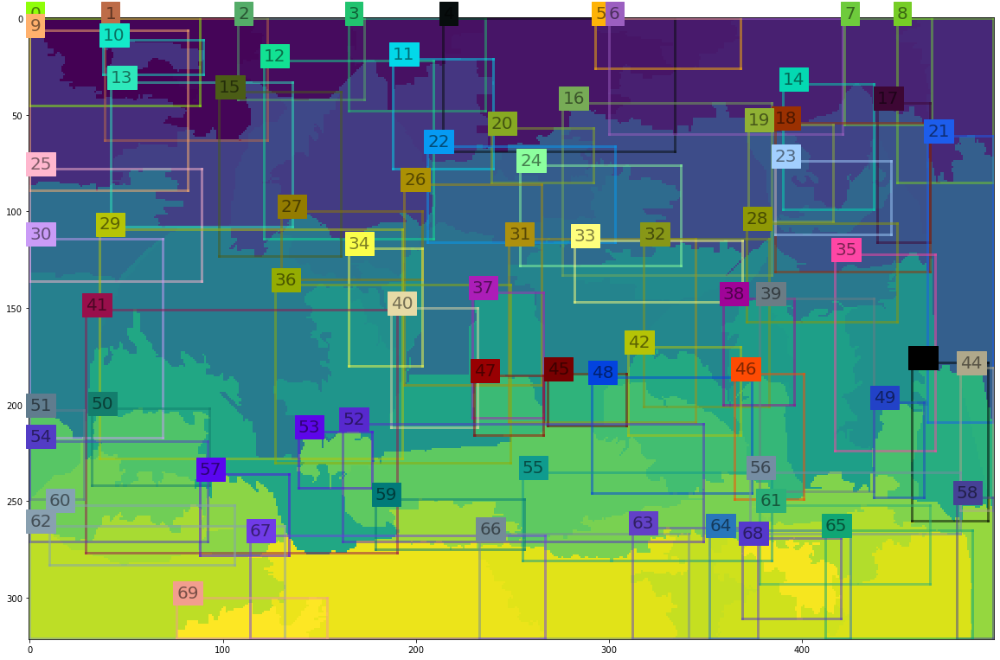

In [11]:
def plt_rectangle(plt,label,x1,y1,x2,y2,color = "yellow", alpha=0.5):
    linewidth = 3
    if type(label) == list:
        linewidth = len(label)*3 + 2
        label = ""
        
    plt.text(x1,y1,label,fontsize=20,backgroundcolor=color,alpha=alpha)
    plt.plot([x1,x1],[y1,y2], linewidth=linewidth,color=color, alpha=alpha)
    plt.plot([x2,x2],[y1,y2], linewidth=linewidth,color=color, alpha=alpha)
    plt.plot([x1,x2],[y1,y1], linewidth=linewidth,color=color, alpha=alpha)
    plt.plot([x1,x2],[y2,y2], linewidth=linewidth,color=color, alpha=alpha)

figsize = (20,20)
plt.figure(figsize=figsize)    
plt.imshow(img[:,:,:3]/2**8)
for item, color in zip(R.values(),sns.xkcd_rgb.values()):
    x1 = item["min_x"]
    y1 = item["min_y"]
    x2 = item["max_x"]
    y2 = item["max_y"]
    label = item["labels"][0]
    plt_rectangle(plt,label,x1,y1,x2,y2,color=color)
plt.show()

plt.figure(figsize=figsize)    
plt.imshow(img[:,:,3])
for item, color in zip(R.values(),sns.xkcd_rgb.values()):
    x1 = item["min_x"]
    y1 = item["min_y"]
    x2 = item["max_x"]
    y2 = item["max_y"]
    label = item["labels"][0]
    plt_rectangle(plt,label,x1,y1,x2,y2,color=color)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


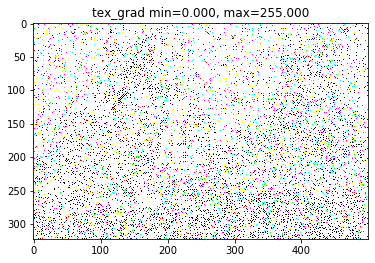

In [12]:
def calc_texture_gradient(img):
    """
        calculate texture gradient for entire image

        The original SelectiveSearch algorithm proposed Gaussian derivative
        for 8 orientations, but we use LBP instead.

        output will be [height(*)][width(*)]
    """
    ret = np.zeros(img.shape[:3])
    for colour_channel in (0, 1, 2):
        ret[:, :, colour_channel] = skimage.feature.local_binary_pattern(
            img[:, :, colour_channel], 8, 1.0)

    return ret


def plot_image_with_min_max(img,nm):
    img = img[:,:,:3]
    plt.imshow(img)
    plt.title("{} min={:5.3f}, max={:5.3f}".format(nm,
                                                   np.min(img),
                                                   np.max(img)))
    plt.show()

tex_grad = calc_texture_gradient(img)   
plot_image_with_min_max(tex_grad,nm="tex_grad")

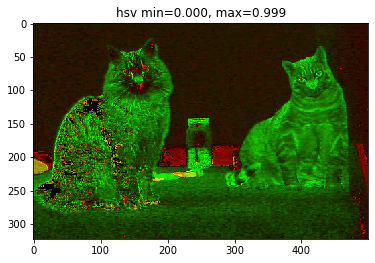

In [13]:
def calc_hsv(img):
    hsv = skimage.color.rgb2hsv(img[:,:,:3])
    return(hsv)

hsv = calc_hsv(img)
plot_image_with_min_max(hsv,nm="hsv")

In [14]:
def calc_hist(img, minhist=0, maxhist=1):
    """
        calculate colour histogram for each region

        the size of output histogram will be BINS * COLOUR_CHANNELS(3)

        number of bins is 25 as same as [uijlings_ijcv2013_draft.pdf]

        extract HSV
        
        len(hist) = BINS * 3
        hist[:BINS] = [0, 10, 20, 0,...,0] meaning that 
           there are 10 pixels that have values between (maxhist - minhist)/BINS*1 and (maxhist - minhist)/BINS*2
           there are 10 pixels that have values between (maxhist - minhist)/BINS*2 and (maxhist - minhist)/BINS*3
    
    """

    BINS = 25
    hist = np.array([])

    for colour_channel in range(3):

        # extracting one colour channel
        c = img[:, colour_channel]

        # calculate histogram for each colour and join to the result
        hist = np.concatenate(
            [hist] + [np.histogram(c, BINS, 
                                   # The lower and upper range of the bins. 
                                   (minhist, maxhist))[0]])

    # L1 normalize
    hist = hist / len(img)
    return hist

def augment_regions_with_histogram_info(tex_grad, img, R,hsv,tex_trad):
    for k, v in list(R.items()):

        ## height and width axies are flattened. 
        ## masked_pixel.shape = (N pixel with this mask ID , 3)
        masked_pixels  = hsv[img[:, :, 3] == k] 
        R[k]["size"]   = len(masked_pixels / 4)
        R[k]["hist_c"] = calc_hist(masked_pixels,minhist=0, maxhist=1)

        # texture histogram
        R[k]["hist_t"] = calc_hist(tex_grad[img[:, :, 3] == k],minhist=0, maxhist=2**8-1)
    return(R)
R = augment_regions_with_histogram_info(tex_grad, img,R,hsv,tex_grad)

In [15]:
def extract_neighbours(regions):
    '''
    check if two regions intersect 
    '''

    def intersect(a, b):
        if (a["min_x"] < b["min_x"] < a["max_x"] and a["min_y"] < b["min_y"] < a["max_y"]) or\
           (a["min_x"] < b["max_x"] < a["max_x"] and a["min_y"] < b["max_y"] < a["max_y"]) or\
           (a["min_x"] < b["min_x"] < a["max_x"] and a["min_y"] < b["max_y"] < a["max_y"]) or\
           (a["min_x"] < b["max_x"] < a["max_x"] and a["min_y"] < b["min_y"] < a["max_y"]):
            return True
        return False

    R = list(regions.items())
    neighbours = []
    for cur, a in enumerate(R[:-1]):
        for b in R[cur + 1:]:
            if intersect(a[1], b[1]):
                neighbours.append((a, b))

    return neighbours

neighbours = extract_neighbours(R)
print("Out of {} regions, we found {} intersecting pairs".format(len(R),len(neighbours)))

Out of 70 regions, we found 198 intersecting pairs


In [16]:
def _sim_colour(r1, r2):
    """
        calculate the sum of histogram intersection of colour
    """
    return sum([min(a, b) for a, b in zip(r1["hist_c"], r2["hist_c"])])


def _sim_texture(r1, r2):
    """
        calculate the sum of histogram intersection of texture
    """
    return sum([min(a, b) for a, b in zip(r1["hist_t"], r2["hist_t"])])


def _sim_size(r1, r2, imsize):
    """
        calculate the size similarity over the image
    """
    return 1.0 - (r1["size"] + r2["size"]) / imsize


def _sim_fill(r1, r2, imsize):
    """
        calculate the fill similarity over the image
    """
    bbsize = (
        (max(r1["max_x"], r2["max_x"]) - min(r1["min_x"], r2["min_x"]))
        * (max(r1["max_y"], r2["max_y"]) - min(r1["min_y"], r2["min_y"]))
    )
    return 1.0 - (bbsize - r1["size"] - r2["size"]) / imsize
def calc_sim(r1, r2, imsize):
    return (_sim_colour(r1, r2)       +\
            _sim_texture(r1, r2)      +\
            _sim_size(r1, r2, imsize) +\
            _sim_fill(r1, r2, imsize))

def calculate_similarlity(img,neighbours,verbose=False):
    # calculate initial similarities
    imsize = img.shape[0] * img.shape[1]
    S = {}
    for (ai, ar), (bi, br) in neighbours:
        S[(ai, bi)] = calc_sim(ar, br, imsize)
        if verbose:
            print("S[({:2.0f}, {:2.0f})]={:3.2f}".format(ai,bi,S[(ai, bi)]))
    return(S)

print("S[(Pair of the intersecting regions)] = Similarity index")
S = calculate_similarlity(img,neighbours,verbose=True)

S[(Pair of the intersecting regions)] = Similarity index
S[( 0,  9)]=7.51
S[( 0, 10)]=7.34
S[( 0, 13)]=7.39
S[( 1,  2)]=7.55
S[( 1,  9)]=7.43
S[( 1, 10)]=7.25
S[( 1, 12)]=6.20
S[( 1, 13)]=7.48
S[( 1, 15)]=5.95
S[( 2, 12)]=6.23
S[( 2, 13)]=7.34
S[( 2, 15)]=6.01
S[( 3, 11)]=7.71
S[( 3, 12)]=6.22
S[( 4,  5)]=7.63
S[( 4,  6)]=7.60
S[( 4, 11)]=7.63
S[( 4, 16)]=7.37
S[( 4, 20)]=7.52
S[( 4, 22)]=7.48
S[( 6, 14)]=5.44
S[( 6, 16)]=7.63
S[( 6, 18)]=5.57
S[( 6, 19)]=5.61
S[( 7, 14)]=5.94
S[( 7, 17)]=7.13
S[( 7, 18)]=5.93
S[( 8, 17)]=6.78
S[( 8, 18)]=5.60
S[( 8, 21)]=7.46
S[( 9, 10)]=7.52
S[( 9, 13)]=7.36
S[(11, 12)]=6.22
S[(11, 20)]=7.43
S[(11, 22)]=7.56
S[(12, 13)]=6.42
S[(12, 15)]=7.09
S[(12, 22)]=6.16
S[(12, 26)]=6.35
S[(12, 27)]=6.85
S[(12, 29)]=6.91
S[(13, 15)]=6.21
S[(13, 25)]=7.47
S[(13, 27)]=5.80
S[(14, 19)]=7.37
S[(15, 27)]=7.14
S[(16, 19)]=5.61
S[(16, 20)]=7.58
S[(16, 22)]=7.57
S[(16, 24)]=7.69
S[(16, 28)]=5.46
S[(16, 31)]=7.39
S[(16, 32)]=5.43
S[(16, 33)]=7.75
S[(17, 21)]=7.10
S[(17, 2

In [18]:
def merge_regions(r1, r2):
    '''
    Suppose r1 and r2 look like: 
    
    (minx1, miny1)
          _____________________
          |                   |
          |     (minx2,maxy2) |
          |           ________|____ 
          |          |        |    |
          |          |        |    |
          |          |________|____|(maxx2, maxy2)
          |___________________|(maxx1, maxy1)
          
    Then for merged region,
    
    minx : minx1
    miny : miny1
    maxx : maxx2
    maxy : maxy1 
    size : the number of pixels in the two regions (intersection is counted twice?)
    
                         
    '''
    new_size = r1["size"] + r2["size"]
    rt = {
        "min_x": min(r1["min_x"], r2["min_x"]),
        "min_y": min(r1["min_y"], r2["min_y"]),
        "max_x": max(r1["max_x"], r2["max_x"]),
        "max_y": max(r1["max_y"], r2["max_y"]),
        "size": new_size,
        "hist_c": (r1["hist_c"] * r1["size"] + r2["hist_c"] * r2["size"]) / new_size,
        "hist_t": (r1["hist_t"] * r1["size"] + r2["hist_t"] * r2["size"]) / new_size,
        "labels": r1["labels"] + r2["labels"]
    }
    return rt

def merge_regions_in_order(S,R,imsize, verbose=False):
    '''
    == Input ==
    S : similarity dictionary
    
    R : dictionary of proposed regions
    
    == Output ==
    
    regions : list of regions
    
    '''
    # hierarchal search
    while S != {}:

        # Step 1: get highest similarity pair of regions from the similarlity dictionary
        i, j = sorted(S.items(), key=lambda i: i[1])[-1][0]

        # Step 2: marge the region pair and add to the region dictionary
        t = max(R.keys()) + 1.0
        R[t] = merge_regions(R[i], R[j])

        # Step 3: from the similarity dictionary, 
        #         remove all the pair of regions where one of the regions is selected in Step 1
        key_to_delete = []
        for k, v in list(S.items()):
            if (i in k) or (j in k):
                key_to_delete.append(k)
        for k in key_to_delete:
            del S[k]

        # Step 4: calculate similarity with new merged region and the regions and its intersecting region
        #         (intersecting region is the region that are to be deleted)
        for k in key_to_delete:
            if k != (i,j):
                if k[0] in (i, j):
                    n = k[1]
                else:
                    n = k[0]
                S[(t, n)] = calc_sim(R[t], R[n], imsize)
    if verbose:
        print("{} regions".format(len(R)))

    ## finally return list of region proposal
    regions = []
    for k, r in list(R.items()):
            regions.append({
                'rect': (
                    r['min_x'],              # min x
                    r['min_y'],              # min y
                    r['max_x'] - r['min_x'], # width 
                    r['max_y'] - r['min_y']),# height
                'size': r['size'],
                'labels': r['labels']
            })
    return(regions)



regions = merge_regions_in_order(S,R,img.shape[0]*img.shape[1],verbose=True)


139 regions


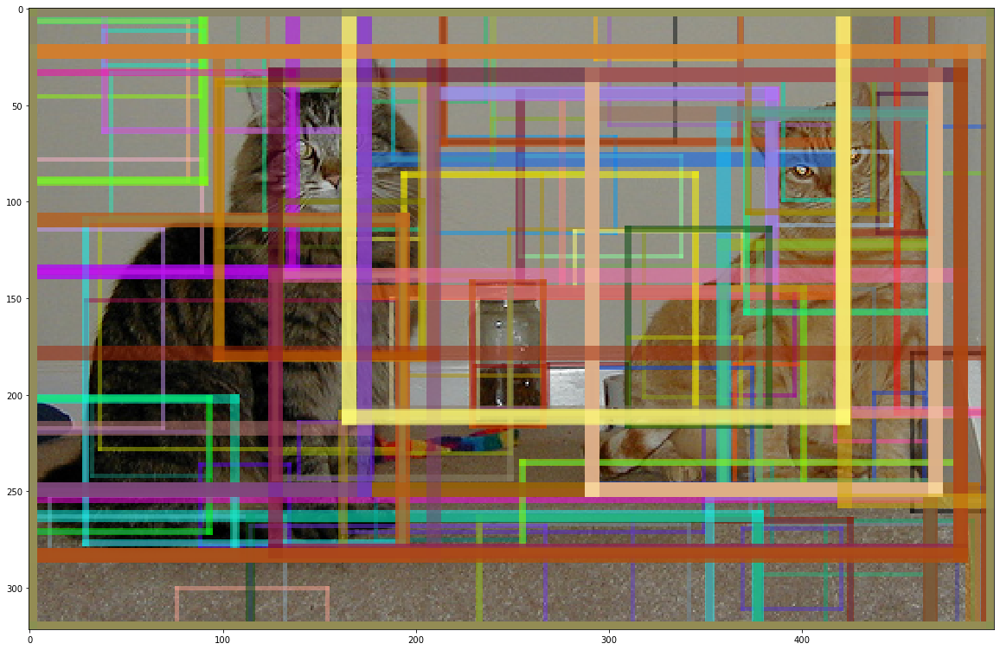

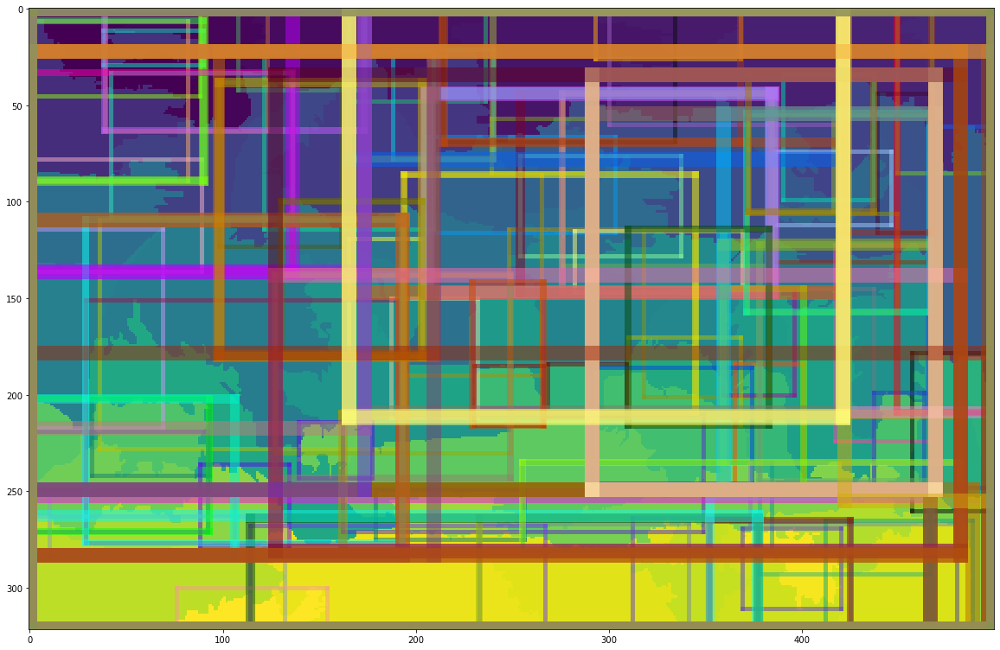

In [19]:
plt.figure(figsize=(20,20))    
plt.imshow(img[:,:,:3]/2**8)
for item, color in zip(regions,sns.xkcd_rgb.values()):
    x1, y1, width, height = item["rect"]
    label = item["labels"][:5]
    plt_rectangle(plt,label,x1,y1,x2 = x1 + width,y2 = y1 + height, color = color)
plt.show()

plt.figure(figsize=(20,20))    
plt.imshow(img[:,:,3])
for item, color in zip(regions,sns.xkcd_rgb.values()):
    x1, y1, width, height = item["rect"]
    label = item["labels"][:5]
    plt_rectangle(plt,label,
                  x1,
                  y1,
                  x2 = x1 + width,
                  y2 = y1 + height, color= color)
plt.show()

In [20]:
def get_region_proposal(img_8bit,min_size = 500):
    img        = image_segmentation(img_8bit,min_size = min_size)
    R          = extract_region(img)    
    tex_grad   = calc_texture_gradient(img)
    hsv        = calc_hsv(img)
    R          = augment_regions_with_histogram_info(tex_grad, img, R,hsv,tex_grad)
    del tex_grad, hsv
    neighbours = extract_neighbours(R)
    S          = calculate_similarlity(img,neighbours)
    regions    = merge_regions_in_order(S,R,imsize = img.shape[0] * img.shape[1])
    return(regions)
regions = get_region_proposal(img_8bit,min_size=500)

regions
print("{} regions are found".format(len(regions)))

139 regions are found


In [21]:
dir_preprocessed = "VOCdevkit/VOC2012"
df_anno = pd.read_csv(os.path.join(dir_preprocessed,"df_anno.csv"),low_memory=False)

In [22]:
cols_bbx = []
for colnm in df_anno.columns:
    if "name" in colnm:
        cols_bbx.append(colnm)
bbx_has_personTF = df_anno[cols_bbx].values == "person"
pick = np.any(bbx_has_personTF,axis=1)
df_anno_person = df_anno.loc[pick,:]

In [23]:
def get_IOU(xmin1,ymin1,xmax1,ymax1,
            xmin2,ymin2,xmax2,ymax2):
    '''
     
    (minx1, miny1)
          _____________________
          |                   |
          |     (minx2,maxy2) |
          |           ________|____ 
          |          |        |    |
          |          |        |    |
          |          |________|____|(maxx2, maxy2)
          |___________________|(maxx1, maxy1)
          
    
                         
    '''    
    def get_wha(xmin1,xmax1,ymin1,ymax1):
            width1  = xmax1 - xmin1
            height1 = ymax1 - ymin1
            area1   = width1 * height1
            return(width1,height1,area1)
    width1,height1,area1 = get_wha(xmin1,xmax1,ymin1,ymax1)
    width2,height2,area2 = get_wha(xmin2,xmax2,ymin2,ymax2)
            
    int_xmin   = np.max([xmin1,xmin2])
    int_ymin   = np.max([ymin1,ymin2])
    int_xmax   = np.min([xmax1,xmax2])
    int_ymax   = np.min([ymax1,ymax2])            
    int_width  = int_xmax - int_xmin
    int_height = int_ymax - int_ymin
    int_area   = int_width*int_height    
    
    if (int_width < 0) or (int_height < 0):
        IOU = 0
    else:
        IOU = int_area / float(area1 + area2 - int_area)
    return(IOU)

In [ ]:
start = time.time()            
person_found_vec = []
for irow in range(df_anno_person.shape[0]): ## run over each frame
    row  = df_anno_person.iloc[irow,:]
    path = os.path.join(img_dir,row["fileID"] + ".jpg")
    img  = imageio.imread(path)
    
    ## calculate region proposal
    regions = get_region_proposal(img,min_size=40)
    
    for ibb in range(row["Nobj"]): ## go over each of the true annotated object
        print("frameID = {:04.0f}/{}, BBXID = {},  N region proposals = {}".format(
            irow, df_anno_person.shape[0], ibb, len(regions)))
        name = row["bbx_{}_name".format(ibb)]
        if name != "person":
            continue 
        ## bounding box of the person     
        true_xmin   = row["bbx_{}_xmin".format(ibb)]
        true_ymin   = row["bbx_{}_ymin".format(ibb)]
        true_xmax   = row["bbx_{}_xmax".format(ibb)]
        true_ymax   = row["bbx_{}_ymax".format(ibb)]   
        person_found_TF = 0
        for r in regions:  ## go over each region proposal and calculate the IoU
            
            prpl_xmin, prpl_ymin, prpl_width, prpl_height = r["rect"]
            IoU = get_IOU(prpl_xmin, prpl_ymin, prpl_xmin + prpl_width, prpl_ymin + prpl_height,
                          true_xmin, true_ymin, true_xmax, true_ymax)
            if IoU > 0.5:
                person_found_TF = 1
        person_found_vec.append(person_found_TF)
end = time.time()  
print("TIME TOOK : {}MIN".format((end-start)/60))
print("Total N of person : {}, Total N of person found : {}, TPR: {:4.3f}".format(
    len(person_found_vec),
    np.sum(person_found_vec),
    np.mean(person_found_vec)))

In [ ]:
print("Total N of person : {}, Total N of person found : {}, TPR: {:4.3f}".format(
    len(person_found_vec),
    np.sum(person_found_vec),
    np.mean(person_found_vec)))

# Part 4 Code

In [26]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

In [34]:
model = tf.keras.applications.mobilenet_v2.MobileNetV2(input_shape=None, alpha=1.0, include_top=True, weights='imagenet', 
                                            input_tensor=None, pooling=None, classes=1000)

MNetV3 = Model(inputs  =  model.inputs, 
                        outputs = model.layers[-3].output)
MNetV3.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_5[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalizationV1) (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu

In [37]:
img_8bit  = imageio.imread(os.path.join(img_dir,imgnm))
regions  = get_region_proposal(img_8bit,min_size=50)
print("{} candidate regions are proposed.".format(len(regions)))

1985 candidate regions are proposed.


In [40]:
def warp(img, newsize):
    '''
    warp image 
    
    
    img     : np.array of (height, width, Nchannel)
    newsize : (height, width)
    '''
    img_resize = skimage.transform.resize(img,newsize)
    return(img_resize)


warped_size = (224, 224)
X = []
for i in [1511,1654,1713,1692,1757]:
    r = regions[i]
    ## extract a single candidate region
    x , y , width, height = r["rect"]
    img_bb     = img_8bit[y:y + height,x:x + width]
    ## warp image
    img_warped = warp(img_bb, warped_size)
    ## create CNN feature
    feature = MNetV3.predict(img_warped.reshape(1,warped_size[0],warped_size[1],3))
    
#     fig = plt.figure(figsize=(20,5))
#     ax = fig.add_subplot(1,3,1)
#     ax.imshow(img_bb)
#     ax.set_title("region proposal, shape={}".format(img_bb.shape))
    
#     ax = fig.add_subplot(1,3,2)
#     ax.imshow(img_warped)
#     ax.set_title("warped image, shape={}".format(img_warped.shape))

#     ax = fig.add_subplot(1,3,3)    
#     ax.imshow(feature, cmap='hot')
#     ax.set_title("feature length = {}".format(len(feature.flatten())))
#     plt.show()

In [41]:
IoU_cutoff_object     = 0.7
IoU_cutoff_not_object = 0.4
objnms = ["image0","info0","image1","info1"]  
dir_result = "result"

In [ ]:
start = time.time()   
# the "rough" ratio between the region candidate with and without objects.
N_img_without_obj = 2 
newsize = (300,400) ## hack
image0, image1, info0,info1 = [], [], [], [] 
for irow in range(df_anno_person.shape[0]):
    ## extract a single frame that contains at least one person object
    row  = df_anno_person.iloc[irow,:]
    ## read in the corresponding frame
    path = os.path.join(img_dir,row["fileID"] + ".jpg")
    img  = imageio.imread(path)
    orig_h, orig_w, _ = img.shape
    ## to reduce the computation speed,
    ## I will do a small hack here. I will resize all the images into newsize = (200,250)    
    img  = warp(img, newsize)
    orig_nh, orig_nw, _ = img.shape
    ## region candidates for this frame
    regions = get_region_proposal(img,min_size=50)[::-1]
    
    ## for each object that exists in the data,
    ## find if the candidate regions contain the person
    for ibb in range(row["Nobj"]): 

        name = row["bbx_{}_name".format(ibb)]
        if name != "person": ## if this object is not person, move on to the next object
            continue 
        if irow % 50 == 0:
            print("frameID = {:04.0f}/{}, BBXID = {:02.0f},  N region proposals = {}, N regions with an object gathered till now = {}".format(
                    irow, df_anno_person.shape[0], ibb, len(regions), len(image1)))
        
        ## extract the bounding box of the person object  
        multx, multy  = orig_nw/orig_w, orig_nh/orig_h 
        true_xmin     = row["bbx_{}_xmin".format(ibb)]*multx
        true_ymin     = row["bbx_{}_ymin".format(ibb)]*multy
        true_xmax     = row["bbx_{}_xmax".format(ibb)]*multx
        true_ymax     = row["bbx_{}_ymax".format(ibb)]*multy
        
        
        person_found_TF = 0
        _image1 = None
        _image0, _info0  = [],[]
        ## for each candidate region, find if this person object is included
        for r in regions:
            
            prpl_xmin, prpl_ymin, prpl_width, prpl_height = r["rect"]
            ## calculate IoU between the candidate region and the object
            IoU = get_IOU(prpl_xmin, prpl_ymin, prpl_xmin + prpl_width, prpl_ymin + prpl_height,
                             true_xmin, true_ymin, true_xmax, true_ymax)
            ## candidate region numpy array
            img_bb = np.array(img[prpl_ymin:prpl_ymin + prpl_height,
                                  prpl_xmin:prpl_xmin + prpl_width])
            
            info = [irow, prpl_xmin, prpl_ymin, prpl_width, prpl_height]
            if IoU > IoU_cutoff_object:
                _image1 = img_bb
                _info1  = info
                break
            elif IoU < IoU_cutoff_not_object:
                _image0.append(img_bb) 
                _info0.append(info) 
        if _image1 is not None:
            # record all the regions with the objects
            image1.append(_image1)
            info1.append(_info1)
            if len(_info0) >= N_img_without_obj: ## record only 2 regions without objects
                # downsample the candidate regions without object 
                # so that the training does not have too much class imbalance. 
                # randomly select N_img_without_obj many frames out of all the sampled images without objects.
                pick = np.random.choice(np.arange(len(_info0)),N_img_without_obj)
                image0.extend([_image0[i] for i in pick ])    
                info0.extend( [_info0[i]  for i in pick ])  

        
end = time.time()  
print("TIME TOOK : {}MIN".format((end-start)/60))

### Save image0, info0, image1, info1 
objs   = [image0,info0,image1,info1]        
for obj, nm in zip(objs,objnms):
    with open(os.path.join(dir_result ,'{}.pickle'.format(nm)), 'wb') as handle:
        pickle.dump(obj, 
                    handle, protocol=pickle.HIGHEST_PROTOCOL)

frameID = 0000/9583, BBXID = 00,  N region proposals = 1158, N regions with an object gathered till now = 0
frameID = 0050/9583, BBXID = 01,  N region proposals = 979, N regions with an object gathered till now = 29
frameID = 0050/9583, BBXID = 02,  N region proposals = 979, N regions with an object gathered till now = 29
frameID = 0050/9583, BBXID = 03,  N region proposals = 979, N regions with an object gathered till now = 30
frameID = 0050/9583, BBXID = 04,  N region proposals = 979, N regions with an object gathered till now = 30
frameID = 0050/9583, BBXID = 05,  N region proposals = 979, N regions with an object gathered till now = 30
frameID = 0050/9583, BBXID = 06,  N region proposals = 979, N regions with an object gathered till now = 30
frameID = 0100/9583, BBXID = 00,  N region proposals = 1015, N regions with an object gathered till now = 50
frameID = 0150/9583, BBXID = 01,  N region proposals = 1176, N regions with an object gathered till now = 85
frameID = 0150/9583, BBXID

In [ ]:
def plot_cadidate_regions_in_training(image1,title):
    fig = plt.figure(figsize=(12,12))
    fig.subplots_adjust(hspace=0.0001,
                        wspace=0.0001,
                        left=0,right=1,bottom=0, top=1)
    print(title)
    nw, nh = 10, 10
    count = 1
    for irow in range(100):#np.random.choice(len(image1),nw*nh):
        im  = image1[irow]
        ax  = fig.add_subplot(nh,nw,count)
        ax.imshow(im)
        ax.axis("off")
        count += 1
    plt.show()
plot_cadidate_regions_in_training(image1,title="plot warped cadidate regions with a person object intraining ")
plot_cadidate_regions_in_training(image0,title="plot warped cadidate regions without a person object intraining ")

In [ ]:
objnms = ["image0","info0","image1","info1"] 
objs  = []
for nm in objnms:
    with open(os.path.join(dir_result,'{}.pickle'.format(nm)), 'rb') as handle:
        objs.append(pickle.load(handle))
image0,info0,image1,info1 = objs 
assert len(image0) == len(info0)
assert len(image1) == len(info1)

print("N candidate regions that has IoU > {} = {}".format(IoU_cutoff_object,len(image0)))
print("N candidate regions that has IoU < {} = {}".format(IoU_cutoff_not_object,len(image0)))

In [ ]:
def warp_and_create_cnn_feature(image,MNetV3):
    '''
    image  : np.array of (N image, shape1, shape2, Nchannel )
    shape 1 and shape 2 depend on each image
    '''
    print("-"*10)
    print("warp_and_create_cnn_feature")
    start = time.time()
    print("len(image)={}".format(len(image)))
    print("**warp image**")
    for irow in range(len(image)):
        image[irow] = warp(image[irow],warped_size)
    image = np.array(image)
    print("**create CNN features**")
    feature = MNetV3.predict(image)
    print("DONE!")
    print("  feature.shape={}".format(feature.shape))
    end = time.time()
    print("  Time Took = {:5.2f}MIN".format((end - start)/60.0))
    print("")
    return(feature)

feature1 = warp_and_create_cnn_feature(image1,MNetV3)
feature0 = warp_and_create_cnn_feature(image0,MNetV3)

N_obj = len(feature1)
## stack the two set of data
## the first Nobj rows contains the person objects
X = np.concatenate((feature1,feature0))
y = np.zeros((X.shape[0],1))
y[:N_obj,0] = 1


## Save data
print("X.shape={}, y.shape={}".format(X.shape,y.shape))
np.save(file = os.path.join(dir_result,"X.npy"),arr = X)
np.save(file = os.path.join(dir_result,"y.npy"),arr = y)

In [ ]:
X = np.load(file = os.path.join(dir_result,"X.npy"))
y = np.load(file = os.path.join(dir_result,"y.npy"))

In [ ]:
prop_train = 0.8

## shuffle the order of X and y
from sklearn.utils import shuffle
X, y = shuffle(X, y, random_state=0)

#X, y = X, y[:,[0]]

Ntrain = int(X.shape[0]*prop_train)
X_train, y_train, X_test, y_test = X[:Ntrain], y[:Ntrain], X[Ntrain:], y[Ntrain:]

In [ ]:
model = Sequential()
model.add(Dense(32, input_dim=4096, init="uniform",activation="relu"))
model.add(Dense(32, activation="relu", kernel_initializer="uniform"))
model.add(Dense(1, kernel_initializer='normal', activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(X_train,
                    y_train,
                    validation_data = (X_test,y_test),
                    batch_size      = 64,
                    nb_epoch        = 50,
                    verbose         = 2)

In [ ]:
fig = plt.figure(figsize=(20,5))
ax  = fig.add_subplot(1,2,1)
for key in ["val_loss","loss"]:
    ax.plot(history.history[key],label=key)
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
plt.legend()
ax  = fig.add_subplot(1,2,2)
for key in ["val_acc","acc"]:
    ax.plot(history.history[key],label=key)
ax.set_xlabel("epoch")
ax.set_ylabel("accuracy")
plt.legend()

plt.show()

In [ ]:
model.save(os.path.join(dir_result,"classifier.h5"))
print("Saved model to disk")